<a href="https://colab.research.google.com/github/SarahiGomezM/Actividad-6-Evaluaci-n-1-/blob/main/Actividad6_Barcelona.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Importar librerías
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from funpymodeling.exploratory import freq_tbl

In [ ]:
# Cargar archivo CSV de Barcelona
data = pd.read_csv("listings_Barcelona.csv")
data.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,18674,Huge flat for 8 people close to Sagrada Familia,71615,Mireia Maria,Eixample,la Sagrada Família,41.405560,2.17262,Entire home/apt,257.0,1,41,2024-05-02,0.30,27,177,5,HUTB-002062
1,23197,"Forum CCIB DeLuxe, Spacious, Large Balcony, relax",90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.412432,2.21975,Entire home/apt,249.0,3,78,2024-05-20,0.48,1,178,7,HUTB005057
2,32711,Sagrada Familia area - Còrsega 1,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.405660,2.17015,Entire home/apt,240.0,1,121,2024-06-05,0.77,2,204,30,HUTB-001722
3,34241,Stylish Top Floor Apartment - Ramblas Plaza Real,73163,Andres,Ciutat Vella,el Barri Gòtic,41.380620,2.17517,Entire home/apt,229.0,5,13,2024-05-06,0.08,3,70,5,Exempt
4,34981,VIDRE HOME PLAZA REAL on LAS RAMBLAS,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379780,2.17623,Entire home/apt,450.0,5,234,2024-06-03,1.40,3,222,29,HUTB-150671


In [ ]:
#Identificar valores nulos por columna .isnull()
valores_nulos=data.isnull().sum()
valores_nulos

,0
id,0
name,0
host_id,0
host_name,2
neighbourhood_group,0
neighbourhood,0
latitude,0
longitude,0
room_type,0
price,3736


In [ ]:
# Realizar una copia del dataframe original para no modificarlo directamente
data1 = data.copy()

In [ ]:
# Sustituir valores nulos en 'host_name' por "Unknown"
data1["host_name"]=data1["host_name"].fillna("Unknown0")

In [ ]:
# Sustituir valores nulos en 'price' por la mediana de los precios
data1["price"]=data1["price"].fillna(round(data["price"].median(),1))

In [ ]:
# Sustituir valores nulos en 'last_review' por la fecha "No Review"
data1["last_review"]=data1["last_review"].fillna("No Review")

In [ ]:
# Sustituir valores nulos en 'reviews_per_month' por 0
data1["reviews_per_month"]=data1["reviews_per_month"].fillna(0)

In [ ]:
# Sustituir valores nulos en 'license' por "No License"
data1["license"]=data1["license"].fillna("No License")

In [ ]:
# Corroborar que ya no hay valores nulos en el dataframe
valores_nulos=data1.isnull().sum()
valores_nulos

,0
id,0
name,0
host_id,0
host_name,0
neighbourhood_group,0
neighbourhood,0
latitude,0
longitude,0
room_type,0
price,0


VALORES ATIPICOS

In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18925 entries, 0 to 18924
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              18925 non-null  int64  
 1   name                            18925 non-null  object 
 2   host_id                         18925 non-null  int64  
 3   host_name                       18925 non-null  object 
 4   neighbourhood_group             18925 non-null  object 
 5   neighbourhood                   18925 non-null  object 
 6   latitude                        18925 non-null  float64
 7   longitude                       18925 non-null  float64
 8   room_type                       18925 non-null  object 
 9   price                           18925 non-null  float64
 10  minimum_nights                  18925 non-null  int64  
 11  number_of_reviews               18925 non-null  int64  
 12  last_review                     

In [ ]:
Cuantitativas=data1.iloc[:,[9,10,11,13,14,15,16]]

In [ ]:
unicos=data1.iloc[:,[0,2,6,7]]

In [ ]:
Cualitativas=data1.iloc[:,[1,3,4,5,8,12,17]]

<Figure size 2000x800 with 0 Axes>

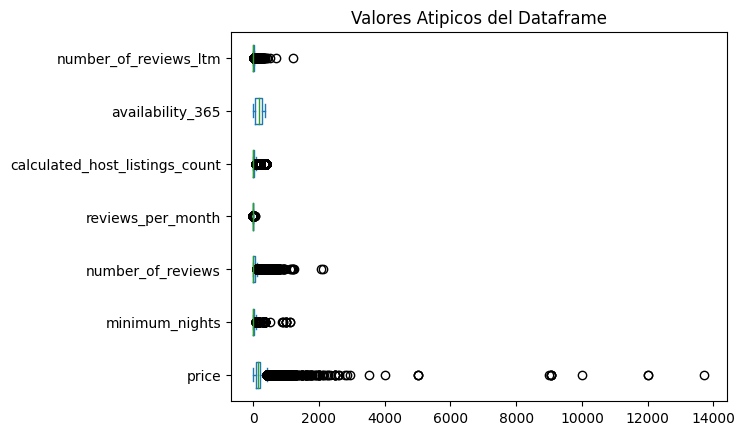

In [ ]:
#Identificación y tratamiento de valores atípicos (outliers)

#Realizamos diagrama de caja y bigote de cada columna del dataframe
fig=plt.figure(figsize=(20,8))
Cuantitativas.plot(kind="box",vert=False)
plt.title("Valores Atipicos del Dataframe")
plt.show() #dibujamos el diagrama

In [ ]:
#Metodo aplicando cuartiles encuentro cuartiles 0.25 y 0.75
y=Cuantitativas

percentile25=y.quantile(0.25) #q1
percentile75=y.quantile(0.75) #q3
iqr=percentile75-percentile25

Limite_Superior= percentile75+1.5*iqr
Limite_Inferior=percentile25-1.5*iqr
print("Limite superior permitido", Limite_Superior)
print("Limite inferior permitido", Limite_Inferior)


Limite superior permitido price                             414.5
minimum_nights                     76.0
number_of_reviews                 120.0
reviews_per_month                   4.3
calculated_host_listings_count     76.0
availability_365                  597.5
number_of_reviews_ltm              37.5
dtype: float64
Limite inferior permitido price                            -117.50
minimum_nights                    -44.00
number_of_reviews                 -72.00
reviews_per_month                  -2.58
calculated_host_listings_count    -44.00
availability_365                 -262.50
number_of_reviews_ltm             -22.50
dtype: float64


In [ ]:
#Obtenemos datos y los outliners se convierten en nulos en el dataframe
Cuantitativas1=Cuantitativas[(y<=Limite_Superior)&(y>=Limite_Inferior)]
Cuantitativas1

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,257.0,1.0,41.0,0.30,27.0,177,5.0
1,249.0,3.0,78.0,0.48,1.0,178,7.0
2,240.0,1.0,NaN,0.77,2.0,204,30.0
3,229.0,5.0,13.0,0.08,3.0,70,5.0
4,NaN,5.0,NaN,1.40,3.0,222,29.0
...,...,...,...,...,...,...,...
18920,314.0,2.0,0.0,0.00,NaN,185,0.0
18921,334.0,2.0,0.0,0.00,NaN,145,0.0
18922,130.0,NaN,0.0,0.00,14.0,267,0.0
18923,167.0,31.0,0.0,0.00,NaN,324,0.0


In [ ]:
# Identificar valores nulos por columna después de eliminar outliers
valores_nulos_outliers = Cuantitativas1.isnull().sum()
valores_nulos_outliers


,0
price,1176
minimum_nights,190
number_of_reviews,2266
reviews_per_month,951
calculated_host_listings_count,2541
availability_365,0
number_of_reviews_ltm,2008


In [ ]:
#Reemplazamos valores atípicos (nulos) del df con "mean"
#Realizamos copia del df
Cuantitativas_limpio=Cuantitativas1.copy()
Cuantitativas_limpio=Cuantitativas_limpio.fillna(round(Cuantitativas1.mean(),1))
Cuantitativas_limpio

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,257.0,1.0,41.0,0.30,27.0,177,5.0
1,249.0,3.0,78.0,0.48,1.0,178,7.0
2,240.0,1.0,18.1,0.77,2.0,204,30.0
3,229.0,5.0,13.0,0.08,3.0,70,5.0
4,146.0,5.0,18.1,1.40,3.0,222,29.0
...,...,...,...,...,...,...,...
18920,314.0,2.0,0.0,0.00,11.6,185,0.0
18921,334.0,2.0,0.0,0.00,11.6,145,0.0
18922,130.0,13.6,0.0,0.00,14.0,267,0.0
18923,167.0,31.0,0.0,0.00,11.6,324,0.0


In [ ]:
# Corroborar valores nulos finales después del tratamiento de outliers
valores_nulos_final = Cuantitativas_limpio.isnull().sum()
valores_nulos_final


,0
price,0
minimum_nights,0
number_of_reviews,0
reviews_per_month,0
calculated_host_listings_count,0
availability_365,0
number_of_reviews_ltm,0


In [ ]:
Valores_limpios=pd.concat([Cuantitativas_limpio,Cualitativas,unicos],axis=1)
Valores_limpios

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,name,host_name,neighbourhood_group,neighbourhood,room_type,last_review,license,id,host_id,latitude,longitude
0,257.0,1.0,41.0,0.30,27.0,177,5.0,Huge flat for 8 people close to Sagrada Familia,Mireia Maria,Eixample,la Sagrada Família,Entire home/apt,2024-05-02,HUTB-002062,18674,71615,41.405560,2.172620
1,249.0,3.0,78.0,0.48,1.0,178,7.0,"Forum CCIB DeLuxe, Spacious, Large Balcony, relax",Etain (Marnie),Sant Martí,el Besòs i el Maresme,Entire home/apt,2024-05-20,HUTB005057,23197,90417,41.412432,2.219750
2,240.0,1.0,18.1,0.77,2.0,204,30.0,Sagrada Familia area - Còrsega 1,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,Entire home/apt,2024-06-05,HUTB-001722,32711,135703,41.405660,2.170150
3,229.0,5.0,13.0,0.08,3.0,70,5.0,Stylish Top Floor Apartment - Ramblas Plaza Real,Andres,Ciutat Vella,el Barri Gòtic,Entire home/apt,2024-05-06,Exempt,34241,73163,41.380620,2.175170
4,146.0,5.0,18.1,1.40,3.0,222,29.0,VIDRE HOME PLAZA REAL on LAS RAMBLAS,Andres,Ciutat Vella,el Barri Gòtic,Entire home/apt,2024-06-03,HUTB-150671,34981,73163,41.379780,2.176230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18920,314.0,2.0,0.0,0.00,11.6,185,0.0,Great 3 bedroom flat in Sants,BeBarceloner,Sants-Montjuïc,Sants,Entire home/apt,No Review,HUTB-012701,1178194119666204675,265193861,41.374267,2.132605
18921,334.0,2.0,0.0,0.00,11.6,145,0.0,Comfy 4bedroom apartment -Sants,BeBarceloner,Sants-Montjuïc,Sants,Entire home/apt,No Review,HUTB-012703,1178201532256668159,265193861,41.373133,2.131792
18922,130.0,13.6,0.0,0.00,14.0,267,0.0,Apartamento nuevo junto al Mar,Sergio,Sant Martí,Diagonal Mar i el Front Marítim del Poblenou,Entire home/apt,No Review,Exempt,1178212135086953099,5107063,41.408517,2.212484
18923,167.0,31.0,0.0,0.00,11.6,324,0.0,Paleo - 2 bedrooms and office in Eixample Dreta,Ukio,Ciutat Vella,"Sant Pere, Santa Caterina i la Ribera",Entire home/apt,No Review,No License,1178741129427938140,346367515,41.389550,2.178390


In [ ]:
Valores_limpios.to_csv("Valores_Barcelona_limpios.csv")

ANALISIS UNIVARIADO

In [ ]:
#Instalamos librería para análisis de variables categóricas
%pip install funpymodeling

In [ ]:
# Limitar numero máximo de filas
pd.options.display.max_rows = None

In [ ]:
#Verificamos información del DataFrame
Valores_limpios.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18925 entries, 0 to 18924
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   price                           18925 non-null  float64
 1   minimum_nights                  18925 non-null  float64
 2   number_of_reviews               18925 non-null  float64
 3   reviews_per_month               18925 non-null  float64
 4   calculated_host_listings_count  18925 non-null  float64
 5   availability_365                18925 non-null  int64  
 6   number_of_reviews_ltm           18925 non-null  float64
 7   name                            18925 non-null  object 
 8   host_name                       18925 non-null  object 
 9   neighbourhood_group             18925 non-null  object 
 10  neighbourhood                   18925 non-null  object 
 11  room_type                       18925 non-null  object 
 12  last_review                     

In [ ]:
#Obtengo un análisis univariado de las variables categóricas
freq_tbl(Valores_limpios)


Streaming output truncated to the last 5000 lines.
919     0.000053         0.736011  
920     0.000053         0.736063  
921     0.000053         0.736116  
922     0.000053         0.736169  
923     0.000053         0.736222  
924     0.000053         0.736275  
925     0.000053         0.736328  
926     0.000053         0.736380  
927     0.000053         0.736433  
928     0.000053         0.736486  
929     0.000053         0.736539  
930     0.000053         0.736592  
931     0.000053         0.736645  
932     0.000053         0.736697  
933     0.000053         0.736750  
934     0.000053         0.736803  
935     0.000053         0.736856  
936     0.000053         0.736909  
937     0.000053         0.736962  
938     0.000053         0.737015  
939     0.000053         0.737067  
940     0.000053         0.737120  
941     0.000053         0.737173  
942     0.000053         0.737226  
943     0.000053         0.737279  
944     0.000053         0.737332  
945     0.000

In [ ]:
#Obtengo un análisis univariado de una variable categórica en específico
table1= freq_tbl(Valores_limpios['name'])
table1

,name,frequency,percentage,cumulative_perc
0,Double or Twin Room,13,0.000687,0.000687
1,Habitación individual,13,0.000687,0.001374
2,Habitación en Barcelona,11,0.000581,0.001955
3,AB Beach Poble Nou,11,0.000581,0.002536
4,AB Casa Saltor,10,0.000528,0.003065
5,Habitación doble con litera en espacio Co-living,9,0.000476,0.003540
6,"Blueground | Dreta de l'Eixample, nr pl. catal...",9,0.000476,0.004016
7,Art Gallery Apartment,9,0.000476,0.004491
8,Elegant and modern 2 bedroom ap near Poble Sec,8,0.000423,0.004914
9,Habitación con baño privado,8,0.000423,0.005337


In [ ]:
Filtro_name = table1[table1['frequency']>6]
Filtro_name

,name,frequency,percentage,cumulative_perc
0,Double or Twin Room,13,0.000687,0.000687
1,Habitación individual,13,0.000687,0.001374
2,Habitación en Barcelona,11,0.000581,0.001955
3,AB Beach Poble Nou,11,0.000581,0.002536
4,AB Casa Saltor,10,0.000528,0.003065
5,Habitación doble con litera en espacio Co-living,9,0.000476,0.003540
6,"Blueground | Dreta de l'Eixample, nr pl. catal...",9,0.000476,0.004016
7,Art Gallery Apartment,9,0.000476,0.004491
8,Elegant and modern 2 bedroom ap near Poble Sec,8,0.000423,0.004914
9,Habitación con baño privado,8,0.000423,0.005337


In [ ]:
Filtro_index_name= Filtro_name.set_index('name')
Filtro_index_name

,frequency,percentage,cumulative_perc
name,,,
Double or Twin Room,13,0.000687,0.000687
Habitación individual,13,0.000687,0.001374
Habitación en Barcelona,11,0.000581,0.001955
AB Beach Poble Nou,11,0.000581,0.002536
AB Casa Saltor,10,0.000528,0.003065
Habitación doble con litera en espacio Co-living,9,0.000476,0.003540
"Blueground | Dreta de l'Eixample, nr pl. catalunya",9,0.000476,0.004016
Art Gallery Apartment,9,0.000476,0.004491
Elegant and modern 2 bedroom ap near Poble Sec,8,0.000423,0.004914


In [ ]:
Filtro_in_f_name= Filtro_index_name.drop(['percentage','cumulative_perc'], axis=1)
Filtro_in_f_name

,frequency
name,
Double or Twin Room,13
Habitación individual,13
Habitación en Barcelona,11
AB Beach Poble Nou,11
AB Casa Saltor,10
Habitación doble con litera en espacio Co-living,9
"Blueground | Dreta de l'Eixample, nr pl. catalunya",9
Art Gallery Apartment,9
Elegant and modern 2 bedroom ap near Poble Sec,8


Text(0, 0.5, 'Frecuencia')

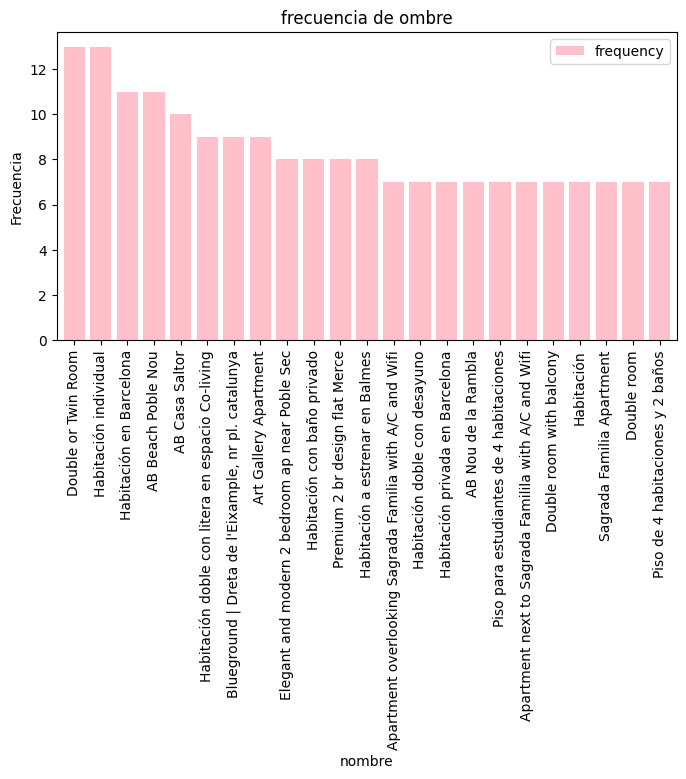

In [ ]:
#Realizamos grafico de dispersión del dataframe filtrado
Filtro_in_f_name.plot(kind = 'bar', width=0.8, figsize=(8,4),color="pink")
plt.title('frecuencia de ombre')
plt.xlabel('nombre')
plt.ylabel('Frecuencia')

In [ ]:
table2= freq_tbl(Valores_limpios['host_name'])
table2

,host_name,frequency,percentage,cumulative_perc
0,Ukio,406,0.021453,0.021453
1,Enter,361,0.019075,0.040528
2,Acomodis Apartments,207,0.010938,0.051466
3,SweetInn,195,0.010304,0.061770
4,AB Apartment Barcelona,184,0.009723,0.071493
5,Stay U-Nique,165,0.008719,0.080211
6,BeBarceloner,149,0.007873,0.088085
7,Alba,145,0.007662,0.095746
8,Habitat Apartments,140,0.007398,0.103144
9,Jordi,138,0.007292,0.110436


In [ ]:
Filtro_hostn = table2[table2['frequency']>10]
Filtro_hostn

,host_name,frequency,percentage,cumulative_perc
0,Ukio,406,0.021453,0.021453
1,Enter,361,0.019075,0.040528
2,Acomodis Apartments,207,0.010938,0.051466
3,SweetInn,195,0.010304,0.061770
4,AB Apartment Barcelona,184,0.009723,0.071493
5,Stay U-Nique,165,0.008719,0.080211
6,BeBarceloner,149,0.007873,0.088085
7,Alba,145,0.007662,0.095746
8,Habitat Apartments,140,0.007398,0.103144
9,Jordi,138,0.007292,0.110436


In [ ]:
Filtro_index_hostn= Filtro_hostn.set_index('host_name')
Filtro_index_hostn

,frequency,percentage,cumulative_perc
host_name,,,
Ukio,406,0.021453,0.021453
Enter,361,0.019075,0.040528
Acomodis Apartments,207,0.010938,0.051466
SweetInn,195,0.010304,0.061770
AB Apartment Barcelona,184,0.009723,0.071493
Stay U-Nique,165,0.008719,0.080211
BeBarceloner,149,0.007873,0.088085
Alba,145,0.007662,0.095746
Habitat Apartments,140,0.007398,0.103144


In [ ]:
Filtro_in_f_hostn= Filtro_index_hostn.drop(['percentage','cumulative_perc'], axis=1)
Filtro_in_f_hostn

,frequency
host_name,
Ukio,406
Enter,361
Acomodis Apartments,207
SweetInn,195
AB Apartment Barcelona,184
Stay U-Nique,165
BeBarceloner,149
Alba,145
Habitat Apartments,140


<Axes: xlabel='frequency', ylabel='cumulative_perc'>

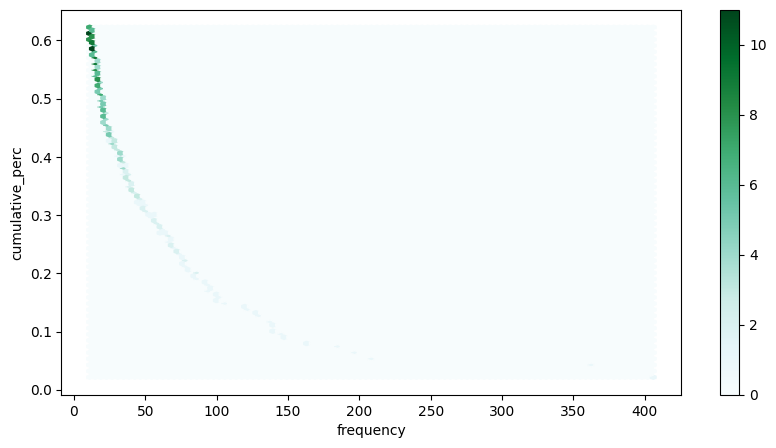

In [ ]:
#Realizamos grafico hexagonal del dataframe filtrado, alternativo al scatter plot
Filtro_index_hostn.plot.hexbin("frequency", "cumulative_perc", figsize=(10,5))

In [ ]:
table3= freq_tbl(Valores_limpios['neighbourhood'])
table3

,neighbourhood,frequency,percentage,cumulative_perc
0,la Dreta de l'Eixample,2256,0.119207,0.119207
1,el Raval,1493,0.078890,0.198098
2,el Barri Gòtic,1258,0.066473,0.264571
3,"Sant Pere, Santa Caterina i la Ribera",1169,0.061770,0.326341
4,la Sagrada Família,1138,0.060132,0.386473
5,l'Antiga Esquerra de l'Eixample,1082,0.057173,0.443646
6,la Vila de Gràcia,1052,0.055588,0.499234
7,Sant Antoni,935,0.049406,0.548639
8,el Poble Sec,891,0.047081,0.595720
9,la Nova Esquerra de l'Eixample,795,0.042008,0.637728


In [ ]:
Filtro_neigh = table3[table3['frequency']>200]
Filtro_neigh

,neighbourhood,frequency,percentage,cumulative_perc
0,la Dreta de l'Eixample,2256,0.119207,0.119207
1,el Raval,1493,0.078890,0.198098
2,el Barri Gòtic,1258,0.066473,0.264571
3,"Sant Pere, Santa Caterina i la Ribera",1169,0.061770,0.326341
4,la Sagrada Família,1138,0.060132,0.386473
5,l'Antiga Esquerra de l'Eixample,1082,0.057173,0.443646
6,la Vila de Gràcia,1052,0.055588,0.499234
7,Sant Antoni,935,0.049406,0.548639
8,el Poble Sec,891,0.047081,0.595720
9,la Nova Esquerra de l'Eixample,795,0.042008,0.637728


In [ ]:
Filtro_index_neigh= Filtro_neigh.set_index('neighbourhood')
Filtro_index_neigh

,frequency,percentage,cumulative_perc
neighbourhood,,,
la Dreta de l'Eixample,2256,0.119207,0.119207
el Raval,1493,0.078890,0.198098
el Barri Gòtic,1258,0.066473,0.264571
"Sant Pere, Santa Caterina i la Ribera",1169,0.061770,0.326341
la Sagrada Família,1138,0.060132,0.386473
l'Antiga Esquerra de l'Eixample,1082,0.057173,0.443646
la Vila de Gràcia,1052,0.055588,0.499234
Sant Antoni,935,0.049406,0.548639
el Poble Sec,891,0.047081,0.595720


In [ ]:
Filtro_in_f_neigh= Filtro_index_neigh.drop(['percentage','cumulative_perc'], axis=1)
Filtro_in_f_neigh

,frequency
neighbourhood,
la Dreta de l'Eixample,2256
el Raval,1493
el Barri Gòtic,1258
"Sant Pere, Santa Caterina i la Ribera",1169
la Sagrada Família,1138
l'Antiga Esquerra de l'Eixample,1082
la Vila de Gràcia,1052
Sant Antoni,935
el Poble Sec,891


<Axes: xlabel='frequency', ylabel='cumulative_perc'>

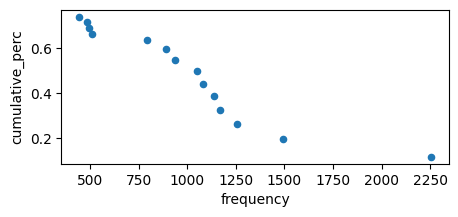

In [ ]:
Filtro_index_neigh.plot("frequency", "cumulative_perc", kind="scatter", figsize=(5,2))

In [ ]:
#Obtengo un análisis univariado de una variable categórica en específico
table4= freq_tbl(Valores_limpios['room_type'])
table4

,room_type,frequency,percentage,cumulative_perc
0,Entire home/apt,11217,0.592708,0.592708
1,Private room,7436,0.392919,0.985627
2,Shared room,151,0.007979,0.993606
3,Hotel room,121,0.006394,1.000000


In [ ]:
#Ajusto el indice de mi dataframe
Room_index= table4.set_index('room_type')
Room_index

,frequency,percentage,cumulative_perc
room_type,,,
Entire home/apt,11217,0.592708,0.592708
Private room,7436,0.392919,0.985627
Shared room,151,0.007979,0.993606
Hotel room,121,0.006394,1.000000


In [ ]:
#Elimino las columnas de "percentage" y "cumulative_perc"
Room_index_frequency= Room_index.drop(['percentage','cumulative_perc'], axis=1)
Room_index_frequency

,frequency
room_type,
Entire home/apt,11217
Private room,7436
Shared room,151
Hotel room,121


Text(0, 0.5, 'Frecuencia')

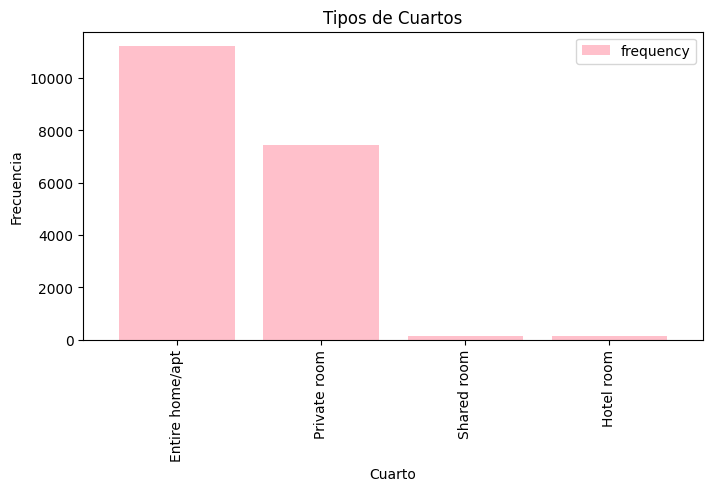

In [ ]:
#Realizamos grafico de barras del dataframe filtrado
Room_index_frequency.plot(kind = 'bar', width=0.8, figsize=(8,4),color="pink")
plt.title('Tipos de Cuartos')
plt.xlabel('Cuarto')
plt.ylabel('Frecuencia')

In [ ]:
#Obtengo un análisis univariado de una variable categórica en específico
table5= freq_tbl(Valores_limpios['last_review'])
table5

,last_review,frequency,percentage,cumulative_perc
0,No Review,4787,0.252946,0.252946
1,2024-06-09,403,0.021295,0.274240
2,2024-05-31,374,0.019762,0.294003
3,2024-06-12,364,0.019234,0.313236
4,2024-06-02,332,0.017543,0.330779
5,2024-05-30,325,0.017173,0.347952
6,2024-06-03,313,0.016539,0.364491
7,2024-06-13,309,0.016328,0.380819
8,2024-06-10,304,0.016063,0.396882
9,2024-05-27,299,0.015799,0.412682


In [ ]:
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
review= table5[table5['frequency']>330]
review

,last_review,frequency,percentage,cumulative_perc
0,No Review,4787,0.252946,0.252946
1,2024-06-09,403,0.021295,0.274240
2,2024-05-31,374,0.019762,0.294003
3,2024-06-12,364,0.019234,0.313236
4,2024-06-02,332,0.017543,0.330779


In [ ]:
#Ajusto el indice de mi dataframe
review_index= review.set_index('last_review')
review_index

,frequency,percentage,cumulative_perc
last_review,,,
No Review,4787,0.252946,0.252946
2024-06-09,403,0.021295,0.274240
2024-05-31,374,0.019762,0.294003
2024-06-12,364,0.019234,0.313236
2024-06-02,332,0.017543,0.330779


In [ ]:
#Elimino las columnas de "percentage" y "cumulative_perc"
review_index_frequency= review_index.drop(['percentage','cumulative_perc'], axis=1)
review_index_frequency

,frequency
last_review,
No Review,4787
2024-06-09,403
2024-05-31,374
2024-06-12,364
2024-06-02,332


<Axes: ylabel='frequency'>

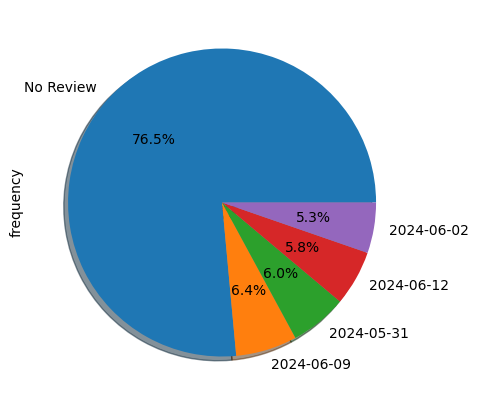

In [ ]:
#Realizamos grafico de pastel del dataframe filtrado
review_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f%%")


In [ ]:
#Obtengo un análisis univariado de una variable categórica en específico
table6= freq_tbl(Valores_limpios['license'])
table6

,license,frequency,percentage,cumulative_perc
0,No License,6138,0.324333,0.324333
1,Exempt,5094,0.269168,0.593501
2,HUTB-000000,135,0.007133,0.600634
3,HUTB-123456,26,0.001374,0.602008
4,AJ000593,22,0.001162,0.603170
5,HB-000087,20,0.001057,0.604227
6,HUTB-022013,18,0.000951,0.605178
7,AJ000517,16,0.000845,0.606024
8,HB004232,13,0.000687,0.606711
9,HB-004688,13,0.000687,0.607398


In [ ]:
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
license= table6[table6['frequency']>=20]
license

,license,frequency,percentage,cumulative_perc
0,No License,6138,0.324333,0.324333
1,Exempt,5094,0.269168,0.593501
2,HUTB-000000,135,0.007133,0.600634
3,HUTB-123456,26,0.001374,0.602008
4,AJ000593,22,0.001162,0.603170
5,HB-000087,20,0.001057,0.604227


In [ ]:
#Ajusto el indice de mi dataframe
license_index= license.set_index('license')
license_index

,frequency,percentage,cumulative_perc
license,,,
No License,6138,0.324333,0.324333
Exempt,5094,0.269168,0.593501
HUTB-000000,135,0.007133,0.600634
HUTB-123456,26,0.001374,0.602008
AJ000593,22,0.001162,0.603170
HB-000087,20,0.001057,0.604227


In [ ]:
#Elimino las columnas de "percentage" y "cumulative_perc"
license_index_frequency= license_index.drop(['percentage','cumulative_perc'], axis=1)
license_index_frequency

,frequency
license,
No License,6138
Exempt,5094
HUTB-000000,135
HUTB-123456,26
AJ000593,22
HB-000087,20


<Axes: xlabel='license'>

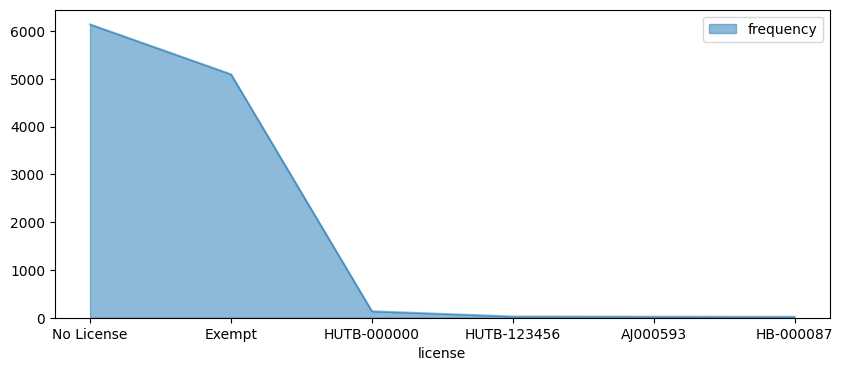

In [ ]:
#Realizamos grafico de área del dataframe filtrado
license_index_frequency.plot(kind='area', figsize=(10,4),alpha = 0.5)